## Advanced Lane Finding Project

The file is only used for creating images/video and visualizing result.
All the required functions are impelemnted in alld (Advanced Lane Line Detection) folder.
Except alld, the pipeline functions is implemented in sdcp4.py

Please refer to README.md for more information

---

In [73]:
import os
import cv2
import numpy as np
import glob
import pickle
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from moviepy.editor import VideoFileClip

from alld import cam
from alld import image_filter
from alld import trans
from alld import road_mgr
from alld import viz_util

from alld.cam import CameraAuxiliary
from alld.image_filter import EdgeDetector
from alld.trans import PerspectiveTrans
from alld.road_mgr import LaneLine, RoadManager
from alld.viz_util import VisualUtil

from sdcp4 import pipeline, pipeline_diag

%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Camera Calibration

In [2]:
def calbrate_camera():
    cb_fns = glob.glob("./camera_cal/calibration*.jpg")
    cam_aux = CameraAuxiliary()
    cb_images = cam_aux.fit(cb_fns, (9, 6))
    cam_aux.save(CameraAuxiliary.DEFAULT_CALBRIATION_FILENAME)

    plt.figure(figsize=(12, len(cb_images)*5))
    for idx, cb_fn in enumerate(cb_fns):
        col = 2
        row = len(cb_fns)
        img = mpimg.imread(cb_fn)
        img = cam_aux.draw_chessboard_corners(img, (9, 6))
        cal_img = cam_aux.calibrate(img)
        #print(img.shape, cal_img.shape)
        plt.subplot(row, col, idx*col+1)
        plt.imshow(img)
        plt.title(cb_fn)
        plt.subplot(row, col, idx*col+2)    
        plt.imshow(cal_img)
        plt.title(cb_fn)
    plt.show()

<alld.cam.CameraAuxiliary object at 0x7fc838726898>: cv2.drawChessboardCorners() fail.
<alld.cam.CameraAuxiliary object at 0x7fc838726898>: cv2.drawChessboardCorners() fail.
<alld.cam.CameraAuxiliary object at 0x7fc838726898>: cv2.drawChessboardCorners() fail.


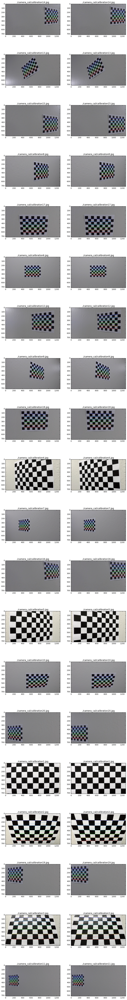

In [3]:
from alld.cam import CameraAuxiliary
calbrate_camera()

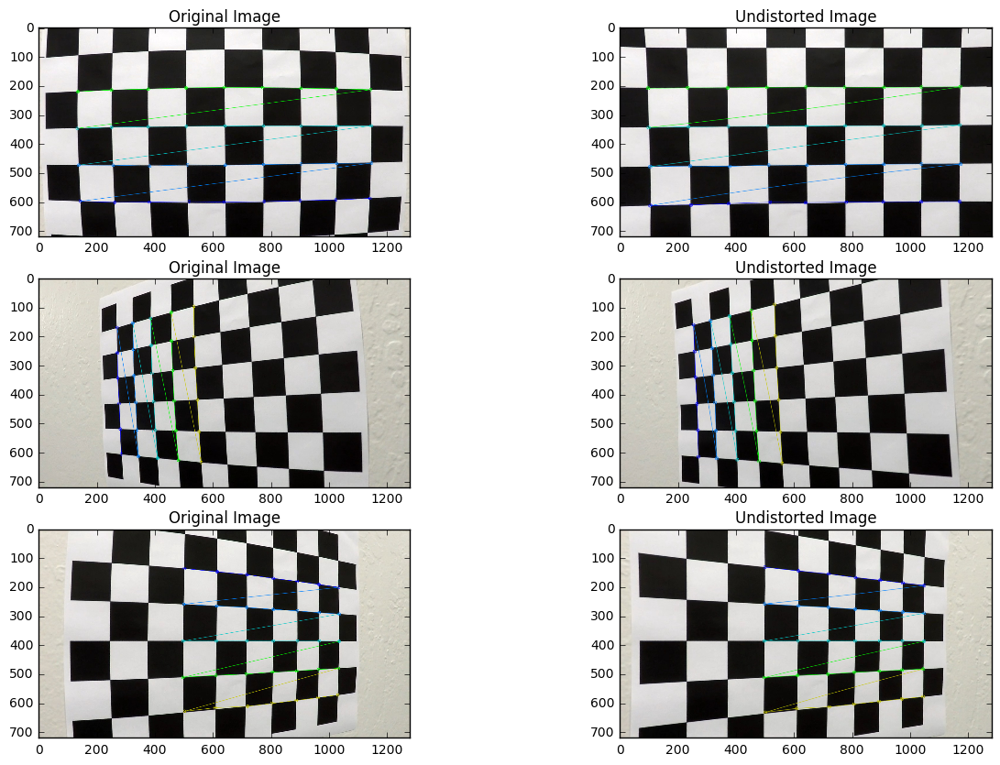

In [4]:
def draw_image_calibration():
    cam_aux = CameraAuxiliary(CameraAuxiliary.DEFAULT_CALBRIATION_FILENAME)
    cb_fns = ["./camera_cal/calibration1.jpg", "./camera_cal/calibration4.jpg", "./camera_cal/calibration5.jpg"]
    cb_size = [(9,4),(6,5),(7,5)]
    plt.figure(figsize=(15, 10))
    for idx, cb_fn in enumerate(cb_fns):
        col = 2
        row = len(cb_fns)
        img = mpimg.imread(cb_fn)
        img = cam_aux.draw_chessboard_corners(img, cb_size[idx])
        cal_img = cam_aux.calibrate(img)
        #print(img.shape, cal_img.shape)
        plt.subplot(row, col, idx*col+1)
        plt.title("Original Image")
        plt.imshow(img)

        plt.subplot(row, col, idx*col+2)    
        plt.title("Undistorted Image")    
        plt.imshow(cal_img)
    plt.savefig("./output_images/calibration.png")
    plt.show()

draw_image_calibration()

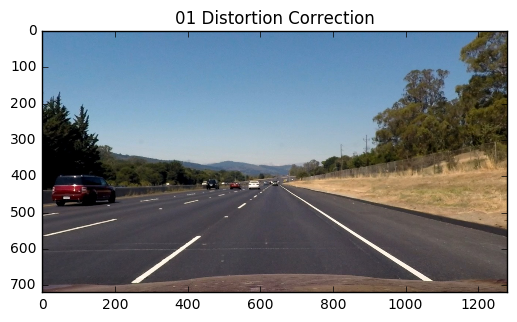

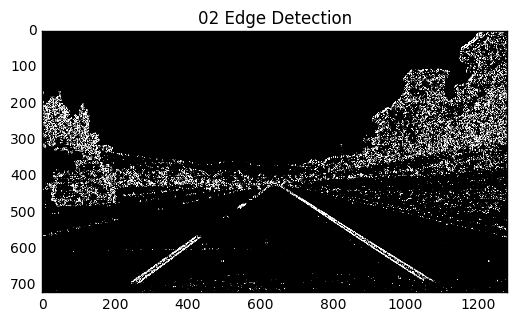

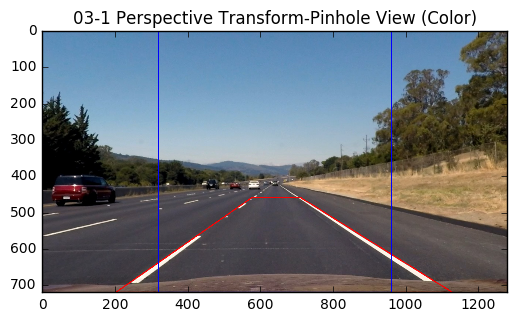

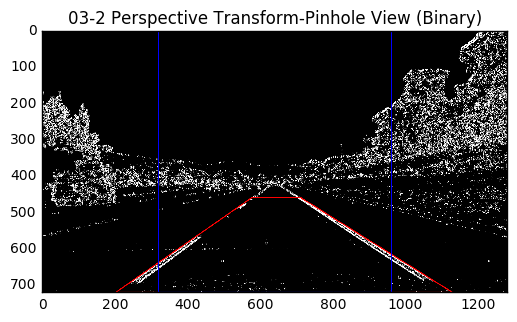

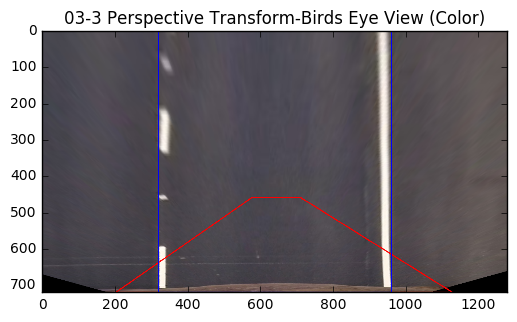

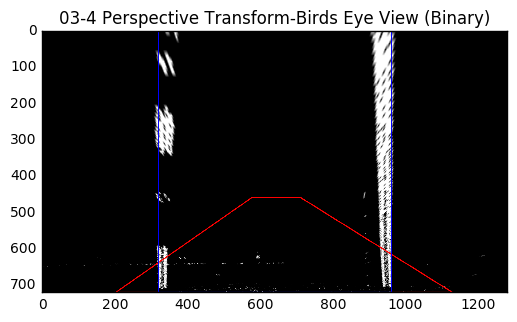

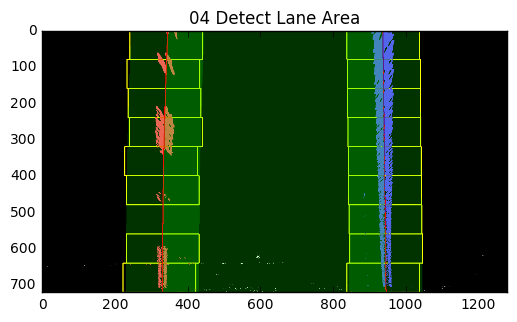

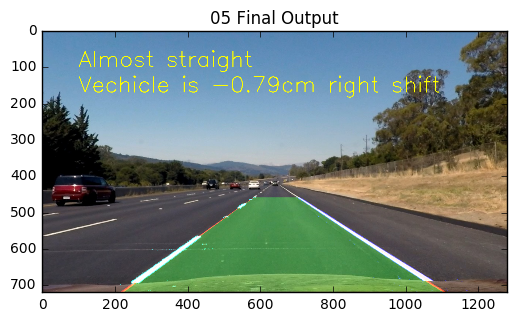

In [5]:
def draw_pipeline(img):
    vis_util = VisualUtil()
    output_image = []
    output_image.append((vis_util.draw_pipeline_undistort_clr_phe(img), "01 Distortion Correction"))
    output_image.append((vis_util.draw_pipeline_edge_bin_phe(img), "02 Edge Detection"))
    output_image.append((vis_util.draw_pipeline_undistort_clr_phe(img, True), "03-1 Perspective Transform-Pinhole View (Color)"))
    output_image.append((vis_util.draw_pipeline_edge_bin_phe(img, True), "03-2 Perspective Transform-Pinhole View (Binary)"))    
    output_image.append((vis_util.draw_pipeline_trans_clr_bev(img, True), "03-3 Perspective Transform-Birds Eye View (Color)"))
    output_image.append((vis_util.draw_pipeline_trans_bin_bev(img, True), "03-4 Perspective Transform-Birds Eye View (Binary)"))
    output_image.append((vis_util.draw_pipeline_lane_detection(img), "04 Detect Lane Area"))
    output_image.append((vis_util.draw_pipleline_final_image(img), "05 Final Output"))

    for idx, (img, title) in enumerate(output_image):
        plt.title("{0}".format(title))
        plt.imshow(img)
        plt.show()
        mpimg.imsave("./output_images/pipeline_{0}".format(idx)+".png", img)
        
img = mpimg.imread('./test_images/straight_lines2.jpg')
draw_pipeline(img)

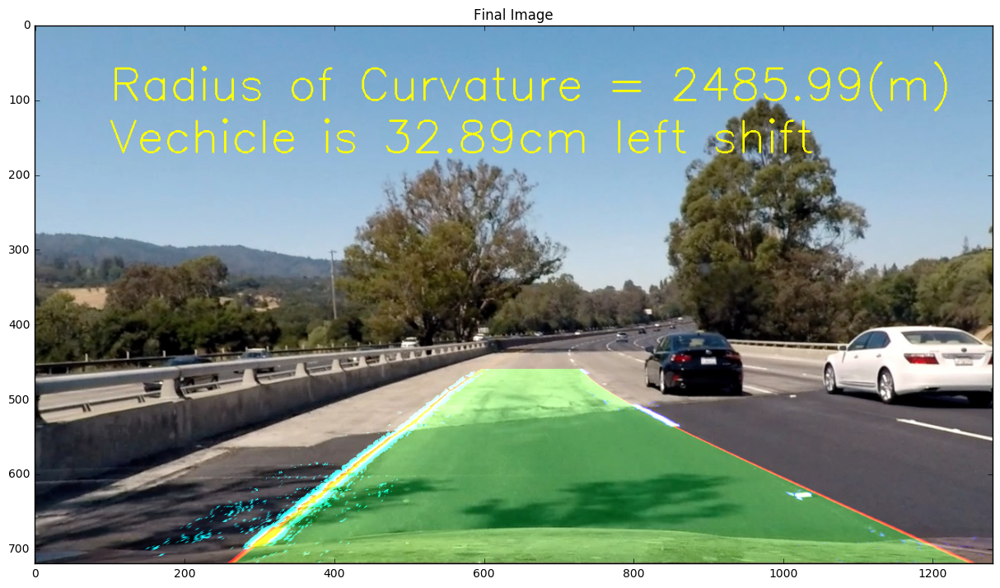

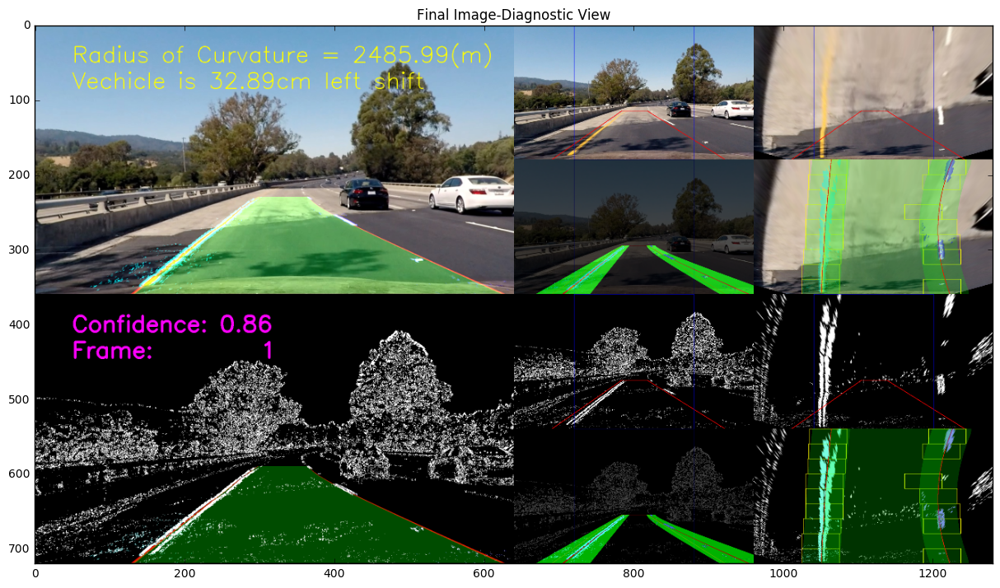

In [6]:
def demo_final_result():
    import sdcp4 
    sdcp4.road = RoadManager((720,1280))

    img = mpimg.imread('./test_images/test4.jpg')
    plt.figure(figsize=(15,15))
    img_final = pipeline(img)
    plt.imshow(img_final)
    plt.title("Final Image")
    plt.show()
    mpimg.imsave("./output_images/final.png", img_final)

    import sdcp4 
    sdcp4.road = RoadManager((720,1280))
    plt.figure(figsize=(15,15))
    img_diag = pipeline_diag(img)
    plt.imshow(img_diag)
    plt.title("Final Image-Diagnostic View")
    mpimg.imsave("./output_images/final_diag.png", img_diag)
    plt.show()
    
demo_final_result()

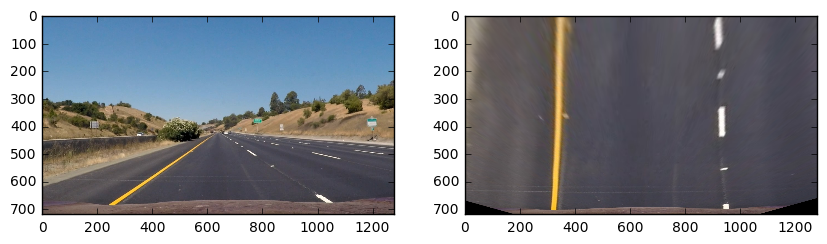

[[  576.           460.        ]
 [  203.33332825   720.        ]
 [ 1126.66662598   720.        ]
 [  710.           460.        ]]
[[ 320.    0.]
 [ 320.  720.]
 [ 960.  720.]
 [ 960.    0.]]


In [7]:
def demo_perspective_trans():
    image = mpimg.imread('./test_images/straight_lines1.jpg')
    persp_trans = PerspectiveTrans()
    image_bev = persp_trans.warp(image)
    plt.figure(figsize=(10,10))
    plt.subplot(1,2,1)
    plt.imshow(image)
    plt.subplot(1,2,2)
    plt.imshow(image_bev)
    plt.show()

    print(persp_trans.src)
    print(persp_trans.dst)
    
demo_perspective_trans()

out_project_video.mp4
[MoviePy] >>>> Building video out_project_video.mp4
[MoviePy] Writing video out_project_video.mp4


100%|█████████▉| 1260/1261 [45:50<00:02,  2.15s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: out_project_video.mp4 

out_challenge_video.mp4
[MoviePy] >>>> Building video out_challenge_video.mp4
[MoviePy] Writing video out_challenge_video.mp4


100%|██████████| 485/485 [17:31<00:00,  2.13s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: out_challenge_video.mp4 

out_harder_challenge_video.mp4
[MoviePy] >>>> Building video out_harder_challenge_video.mp4
[MoviePy] Writing video out_harder_challenge_video.mp4


  6%|▌         | 74/1200 [02:41<40:53,  2.18s/it]rescan in low confidence:0.2997793003411173
Scan error: pix_x_l:0, pix_y_l:0, pix_x_r:1757, pix_y_r:1757,
  6%|▋         | 75/1200 [02:43<40:52,  2.18s/it]rescan in low confidence:0.3049797329076182
Scan error: pix_x_l:0, pix_y_l:0, pix_x_r:963, pix_y_r:963,
  6%|▋         | 76/1200 [02:45<41:19,  2.21s/it]rescan in low confidence:0.30197979989199497
Scan error: pix_x_l:0, pix_y_l:0, pix_x_r:1752, pix_y_r:1752,
  6%|▋         | 77/1200 [02:47<41:27,  2.22s/it]rescan in low confidence:0.2989137907811223
Scan error: pix_x_l:0, pix_y_l:0, pix_x_r:1716, pix_y_r:1716,
  6%|▋         | 78/1200 [02:50<41:13,  2.20s/it]rescan in low confidence:0.29990094123174105
Scan error: pix_x_l:0, pix_y_l:0, pix_x_r:1372, pix_y_r:1372,
  7%|▋         | 79/1200 [02:52<41:30,  2.22s/it]rescan in low confidence:0.2995326977469739
Scan error: pix_x_l:0, pix_y_l:0, pix_x_r:1095, pix_y_r:1095,
  7%|▋         | 80/1200 [02:54<42:03,  2.25s/it]rescan in low confide

[MoviePy] Done.
[MoviePy] >>>> Video ready: out_harder_challenge_video.mp4 



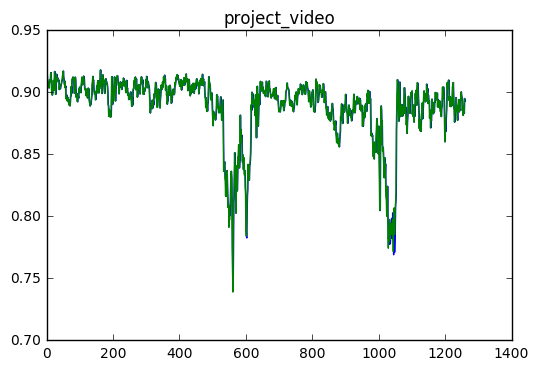

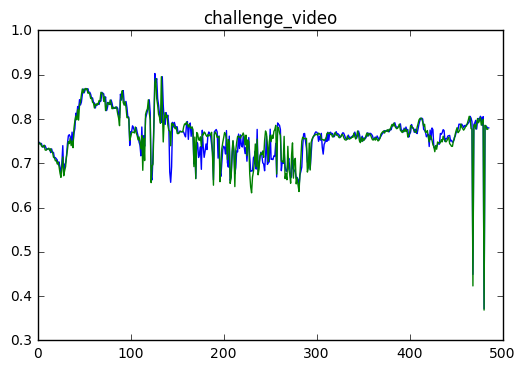

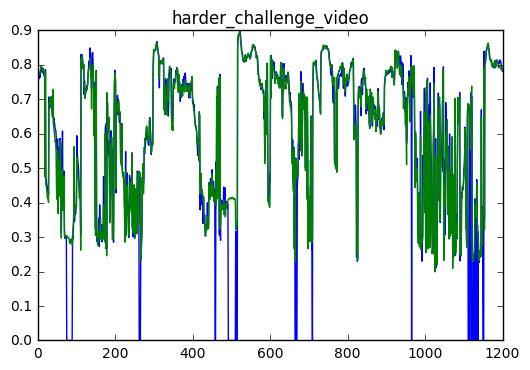

In [8]:
processed_fn = []
history_conf = []
history_conf_fast = []

v_in_fns = ['project_video.mp4', 'challenge_video.mp4', 'harder_challenge_video.mp4']
for v_in_fn in v_in_fns:
    #reset road
    import sdcp4
    sdcp4.road = RoadManager((720,1280))
    fn = os.path.split(v_in_fn)[1]
    v_out_fn = "out_" + fn
    print(v_out_fn)
    processed_fn.append(fn.split('.')[0])
    clip = VideoFileClip(v_in_fn)
    processed_clip = clip.fl_image(pipeline)
    processed_clip.write_videofile(v_out_fn, audio=False)
    history_conf.append(sdcp4.road.conf)
    history_conf_fast.append(sdcp4.road.conf_fast)
    
for idx in range(len(history_conf)):
    plt.plot(history_conf[idx])
    plt.plot(history_conf_fast[idx])
    plt.title(processed_fn[idx])
    plt.savefig("./output_images/confidence_"+processed_fn[idx]+".png")
    plt.show()

In [21]:
v_in_fns = ['project_video.mp4', 'challenge_video.mp4', 'harder_challenge_video.mp4']
for v_in_fn in v_in_fns:
    #reset road
    import sdcp4
    sdcp4.road = RoadManager((720,1280))
    fn = os.path.split(v_in_fn)[1]
    v_out_fn = "out_diag_" + fn
    clip = VideoFileClip(v_in_fn)
    processed_clip = clip.fl_image(pipeline_diag)
    processed_clip.write_videofile(v_out_fn, audio=False)

[MoviePy] >>>> Building video out_diag_project_video.mp4
[MoviePy] Writing video out_diag_project_video.mp4


100%|█████████▉| 1260/1261 [59:22<00:02,  2.79s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: out_diag_project_video.mp4 

[MoviePy] >>>> Building video out_diag_challenge_video.mp4
[MoviePy] Writing video out_diag_challenge_video.mp4


100%|██████████| 485/485 [22:55<00:00,  2.83s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: out_diag_challenge_video.mp4 

[MoviePy] >>>> Building video out_diag_harder_challenge_video.mp4
[MoviePy] Writing video out_diag_harder_challenge_video.mp4


  6%|▌         | 74/1200 [03:28<51:25,  2.74s/it]rescan in low confidence:0.2997793003411173
Scan error: pix_l:0, pix_r:1757, lane_l_x:0, lane_l_y:0, lane_r_x:33159, lane_r_y:33159
  6%|▋         | 75/1200 [03:31<50:45,  2.71s/it]rescan in low confidence:0.3049797329076182
Scan error: pix_l:0, pix_r:963, lane_l_x:0, lane_l_y:0, lane_r_x:34230, lane_r_y:34230
  6%|▋         | 76/1200 [03:34<50:41,  2.71s/it]rescan in low confidence:0.30197979989199497
Scan error: pix_l:0, pix_r:1752, lane_l_x:0, lane_l_y:0, lane_r_x:32528, lane_r_y:32528
  6%|▋         | 77/1200 [03:36<50:28,  2.70s/it]rescan in low confidence:0.2989137907811223
Scan error: pix_l:0, pix_r:1716, lane_l_x:0, lane_l_y:0, lane_r_x:31478, lane_r_y:31478
  6%|▋         | 78/1200 [03:39<50:07,  2.68s/it]rescan in low confidence:0.29990094123174105
Scan error: pix_l:0, pix_r:1372, lane_l_x:0, lane_l_y:0, lane_r_x:29970, lane_r_y:29970
  7%|▋         | 79/1200 [03:42<50:13,  2.69s/it]rescan in low confidence:0.2995326977469739
S

[MoviePy] Done.
[MoviePy] >>>> Video ready: out_diag_harder_challenge_video.mp4 



./frames/harder_challenge_video/frame0140.jpg


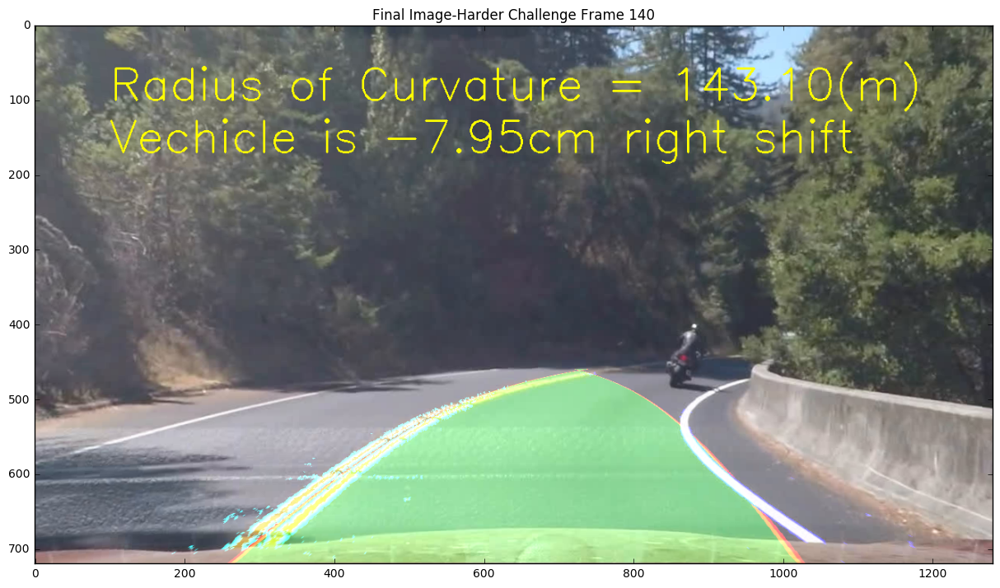

In [45]:
def draw_challenge(fns):
    import sdcp4
    sdcp4.road = RoadManager((720,1280))
    for fn in fns:    
        print(fn)
        plt.figure(figsize=(15,10))
        image = sdcp4.pipeline(mpimg.imread(fn))
        plt.imshow(image)
        mpimg.imsave('./output_images/harder_challenge.png', image)        
        plt.title("Final Image-Harder Challenge Frame 140".format())
        plt.show()

fns = glob.glob("./frames/harder_challenge_video/frame0140.jpg")        
draw_challenge(fns)

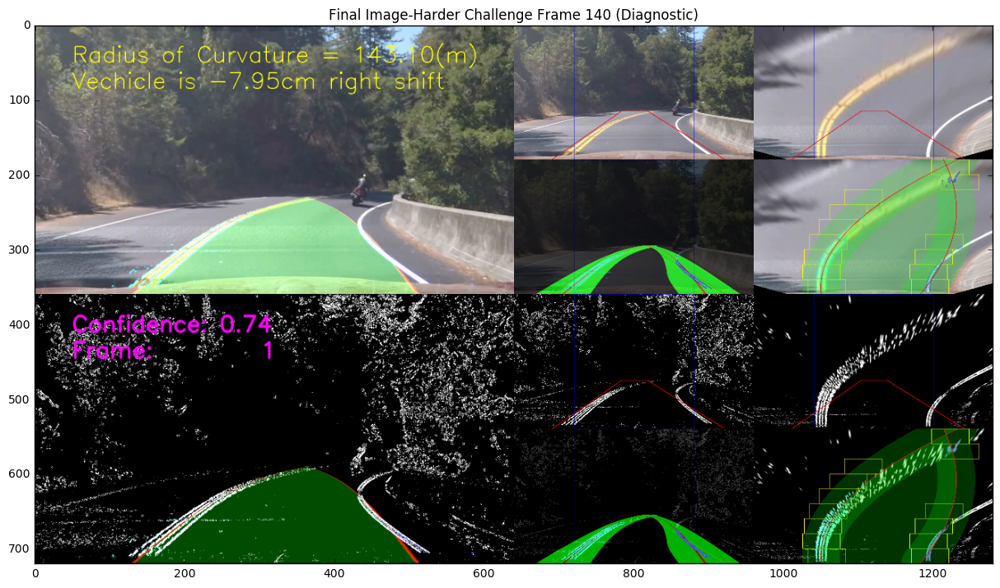

In [71]:
def draw_challenge_diag(fns):
    import sdcp4
    sdcp4.road = RoadManager((720,1280))
    for fn in fns:    
        plt.figure(figsize=(15,10))
        img = pipeline_diag(mpimg.imread(fn))
        plt.imshow(img)
        plt.imsave('./output_images/harder_challenge_diag.png', img)
        plt.title("Final Image-Harder Challenge Frame 140 (Diagnostic)".format())
        plt.show()

fns = glob.glob("./frames/harder_challenge_video/frame0140.jpg")        
draw_challenge_diag(fns)

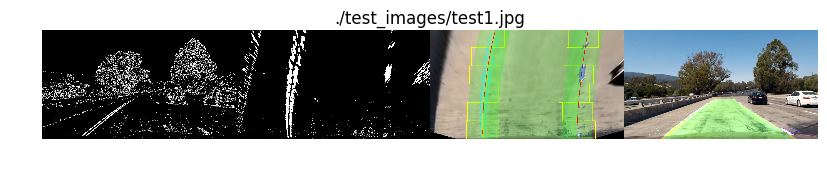

In [74]:
def draw_pipeline_states(fns):
    cam_aux = CameraAuxiliary(CameraAuxiliary.DEFAULT_CALBRIATION_FILENAME)
    edge_dector = EdgeDetector()
    visual = VisualUtil()
    persp_trans = PerspectiveTrans()

    for fn in fns:
        road = RoadManager((720,1280), scan_win_counts = 6, scan_win_width = 200)
        image = mpimg.imread(fn)
        image = cam_aux.calibrate(image)
        chn_edge = edge_dector.detect_edge_complex_3(image)
        image_pipe = visual.draw_pipeline(image, chn_edge, fn, road)
        mpimg.imsave("./output_images/harder_challenge_pipeline.png", image_pipe)
        plt.figure(figsize=(10,10))
        plt.axis('off')
        plt.imshow(image_pipe)
        plt.title(fn)
        plt.show()
        
fns = glob.glob("./test_images/test1.jpg")
draw_pipeline_states(fns)

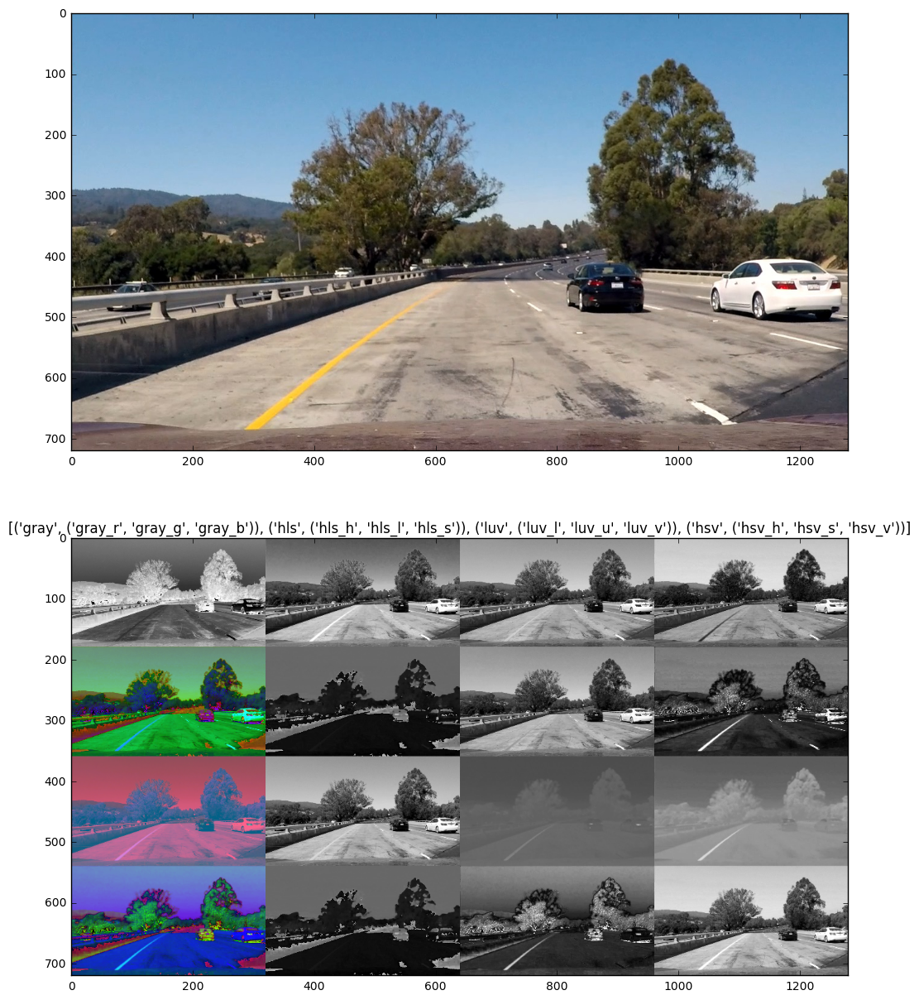

In [63]:
def draw_all_channels(fns):
    from alld import viz_util
    viz = viz_util.VisualUtil()
    for img_fn in fns:
        img = mpimg.imread(img_fn)
        img_chn, titles = viz.draw_all_channels(img)
        plt.figure(figsize=(15,15))
        plt.subplot(2,1,1)
        plt.imshow(img)
        mpimg.imsave("./output_images/all_channel_img.png", img)
        plt.subplot(2,1,2)
        plt.imshow(img_chn)
        mpimg.imsave("./output_images/all_channel_chn.png", img_chn)
        plt.title(titles)
        plt.show()
    
fns = glob.glob("./test_images/test1.jpg")
draw_all_channels(fns)

./test_images/test1.jpg


Scan error: pix_x_l:0, pix_y_l:0, pix_x_r:252, pix_y_r:252,


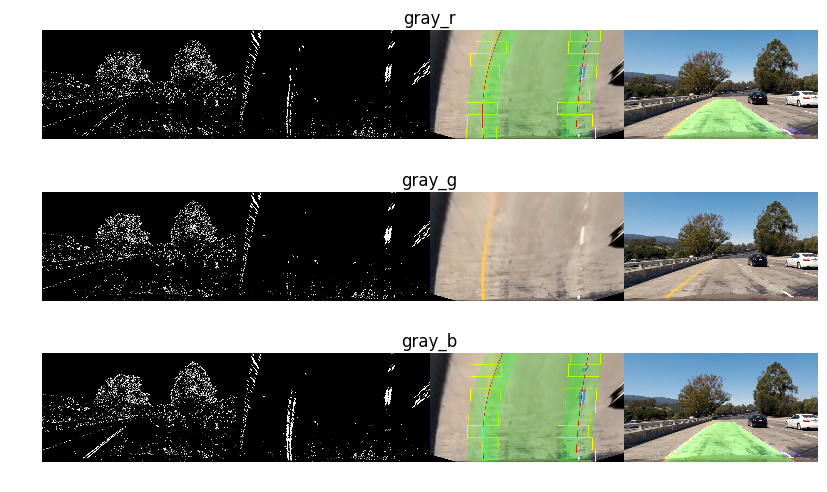

Scan error: pix_x_l:0, pix_y_l:0, pix_x_r:0, pix_y_r:0,
Scan error: pix_x_l:0, pix_y_l:0, pix_x_r:243, pix_y_r:243,


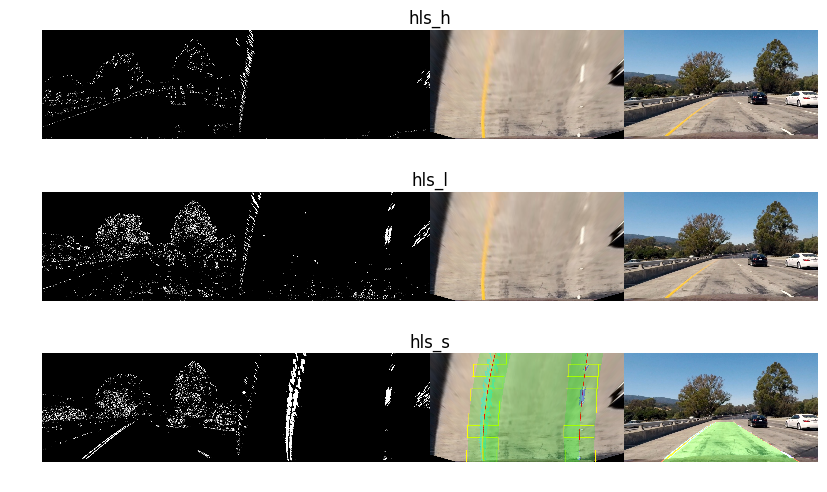

Scan error: pix_x_l:0, pix_y_l:0, pix_x_r:160, pix_y_r:160,


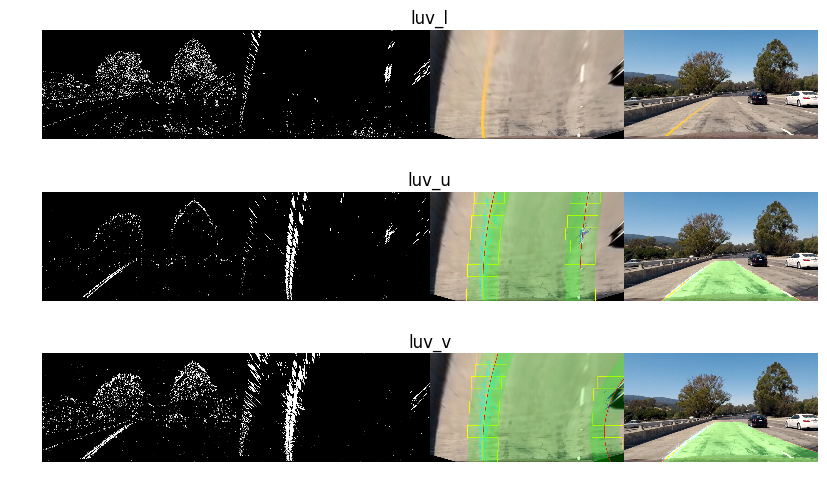

Scan error: pix_x_l:0, pix_y_l:0, pix_x_r:0, pix_y_r:0,


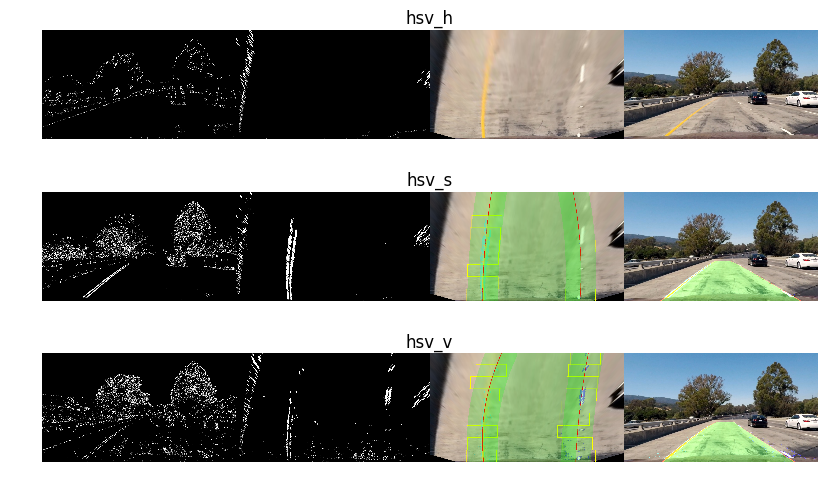

In [64]:
def draw_pipeline_by_all_channels(fns):
    cam_aux = CameraAuxiliary(CameraAuxiliary.DEFAULT_CALBRIATION_FILENAME)
    edge_dector = EdgeDetector()
    visual = VisualUtil()
    persp_trans = PerspectiveTrans()
    ksize=3
    thres=[(20, 130), (20, 130), (20, 130), (0.3, 1.2)]
    edge_dector = EdgeDetector()
    
    for img_fn in fns:
        print(img_fn)
        image = mpimg.imread(img_fn)
        image = cam_aux.calibrate(image)
        chn_groups, names = edge_dector.create_all_channels(image)
        for chn_group, name_group in zip(chn_groups, names):
            idx = 1
            row = len(names)
            plt.figure(figsize=(10,len(names)*2))
            for chn, name in zip(chn_group[1], name_group[1]):
                road = RoadManager((720,1280))
                chn_edge = edge_dector.edge_detect_xoyom_and_d(chn, ksize, thres)
                image_pipe = visual.draw_pipeline(image, chn_edge, persp_trans, fn, road)
                plt.subplot(row, 1, idx)
                plt.axis('off')
                plt.imshow(image_pipe)
                mpimg.imsave("./output_images/pipeline_all_channel_"+name+".png", image_pipe)
                plt.title(name)
                idx+=1
            plt.show()

                
fns = glob.glob("./test_images/test1.jpg")        
draw_pipeline_by_all_channels(fns)                

In [39]:
cam_aux = CameraAuxiliary(CameraAuxiliary.DEFAULT_CALBRIATION_FILENAME)
edge_dector = EdgeDetector()
persp_trans = PerspectiveTrans()
road = RoadManager((720,1280))
visual = VisualUtil()

hist_scan_fast = []
def pipeline_eval_scan_fast(image):
    image = cam_aux.calibrate(image)
    edge = edge_dector.detect(image)
    edge_bev = persp_trans.warp(edge)
    img_bev = persp_trans.warp(image)
    road.detect(edge_bev)
    cost, dist, curve = road.confidence()
    hist_scan_fast.append((cost, dist, curve))
    return image  

In [40]:
def split_video():
#Split video into frames
    input_video = ['../challenge_video.mp4', '../harder_challenge_video.mp4']
    for v_in_fn in input_video:
        fn = os.path.split(v_in_fn)[1]
        base_name = "video/" + fn.split('.')[0]
        if not os.path.exists(base_name):
            os.mkdir(base_name)

        clip = VideoFileClip(v_in_fn)
        clip.to_images_sequence(base_name+"/frame%04d.jpg")
        
def test_frames():
#Apply pipeline on video frames
    images_fn = glob.glob("*/frame*.jpg")
    cannot_fit_images = []
    for img_fn in images_fn:
        img = mpimg.imread(img_fn)
        #print(img_fn)
        try: 
            img_out = process_image(img)        
        except:
            cannot_fit_images.append(img_fn)
    return cannot_fit_images

#cannont_fit_images = test_frames()
#print(cannont_fit_images)

#with open('unsolved.p', 'rb') as f:
#    cannont_fit_images = pickle.load(f)   


In [43]:
from IPython.core.display import display, HTML

HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format('out_project_video.mp4'))

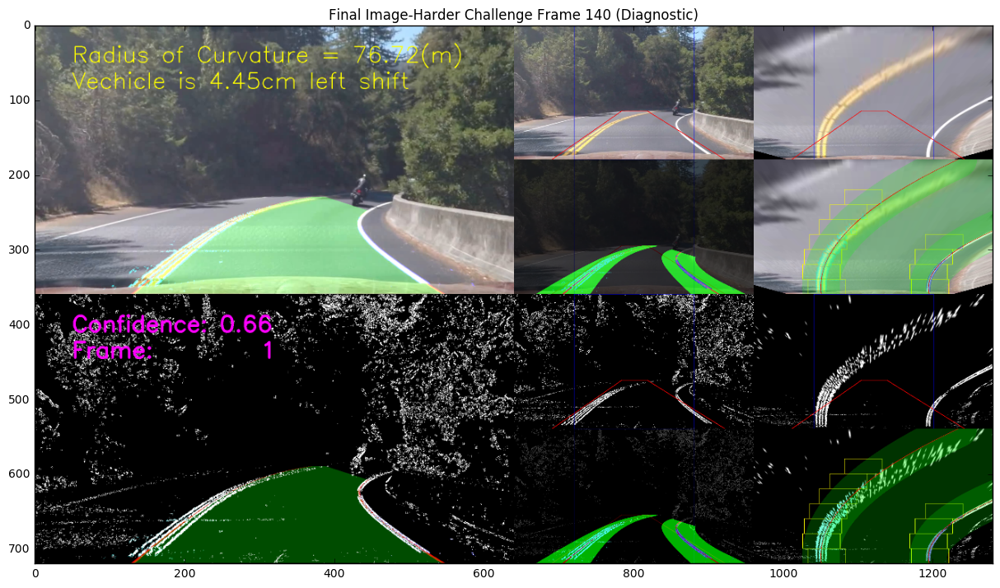

In [68]:
fns = glob.glob("./frames/harder_challenge_video/frame0140.jpg")        
draw_challenge_diag(fns)